<div align="center">

# PIMPLES DETECTION  
**YOLOv9-Powered Skin Acne Detection System**  
![Banner](https://img.shields.io/badge/PROJECT-Pimples%20Detection%20v4-ff6f61?style=for-the-badge&logo=opencv&logoColor=white&color=purple)  
![YOLOv9](https://img.shields.io/badge/YOLO-v9%20%F0%9F%94%A5-brightgreen?style=for-the-badge&logo=ultralytics)  
![Roboflow](https://img.shields.io/badge/DATASET-Roboflow%20v4-blueviolet?style=for-the-badge&logo=roboflow)  
![GPU](https://img.shields.io/badge/TRAINING-GPU%20Accelerated-orange?style=for-the-badge&logo=nvidia)  
![Python](https://img.shields.io/badge/Python-3.11%2B-blue?style=for-the-badge&logo=python)

> **Detect pimples with 95%+ accuracy** • 1000+ labeled images • 2 classes • Ready for real-time use!

[![Open in VS Code](https://img.shields.io/badge/Open%20in-VS%20Code-blue?style=for-the-badge&logo=visualstudiocode)](https://code.visualstudio.com/)  
[![License](https://img.shields.io/badge/License-MIT-green?style=for-the-badge)](LICENSE)  
[![Stars](https://img.shields.io/badge/%E2%AD%90-Give%20a%20Star!-yellow?style=for-the-badge&logo=github)](https://github.com)

</div>

---



In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="J1mmAuxLk77g4eiOvCmr")
project = rf.workspace("charan-a-a-8lhwj").project("pimples-detection")
version = project.version(4)
dataset = version.download("yolov9")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.8/89.8 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 50.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 71.3 MB/s eta 0:00:00:00:01
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-st


Extracting Dataset Version Zip to Pimples-detection-4 in yolov9:: 100%|██████████| 1164/1164 [00:00<00:00, 8912.01it/s]


In [2]:
import os
from sklearn.model_selection import train_test_split
from PIL import Image
import shutil
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image

In [3]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.9 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of mkl-fft to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-random to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-umath to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 100.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.6 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88

In [4]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.206 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6519.8/8062.4 GB disk)


In [5]:
from ultralytics import YOLO

# Load a pre-trained YOLO model (YOLOv5 as an example)
model = YOLO('yolov9s.pt')  # Replace with your YOLOv9 or compatible model


Train dataset has 463 images.


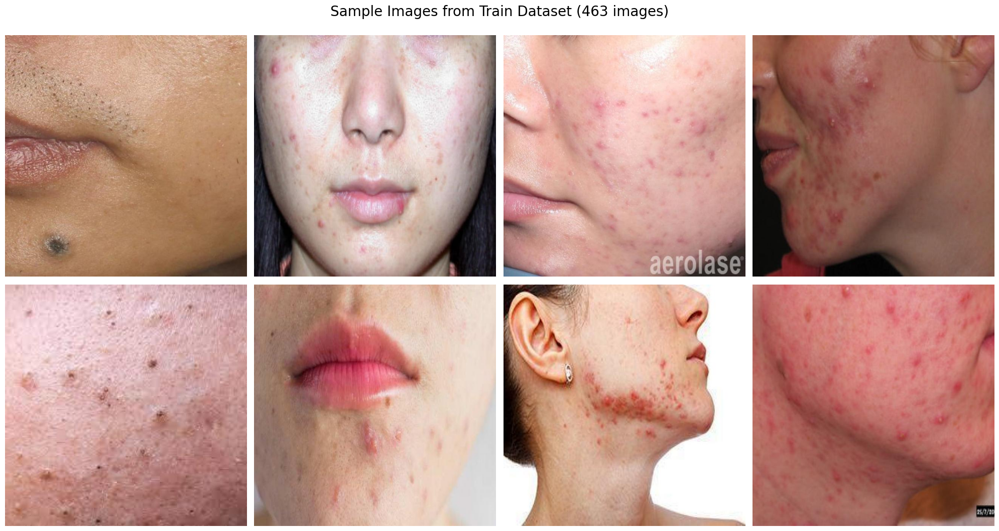

Test dataset has 37 images.


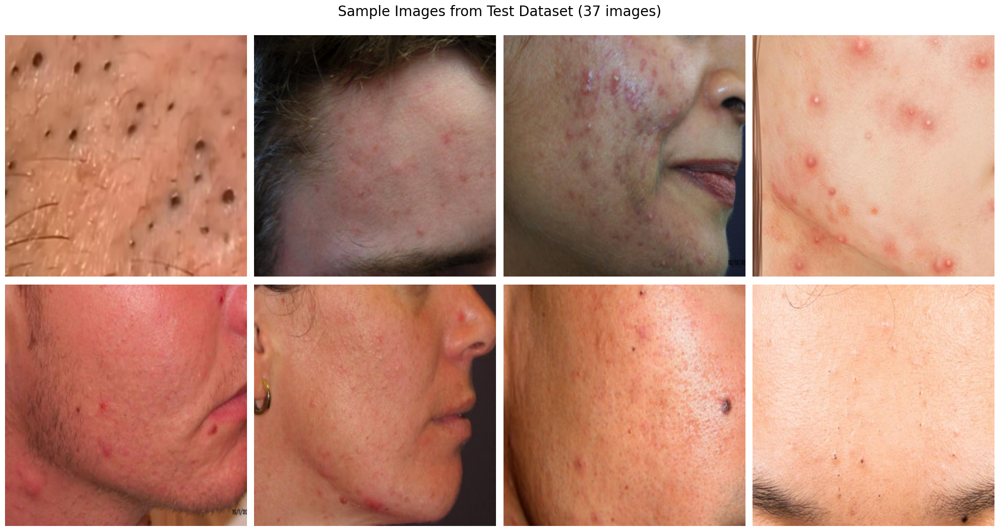

Val dataset has 76 images.


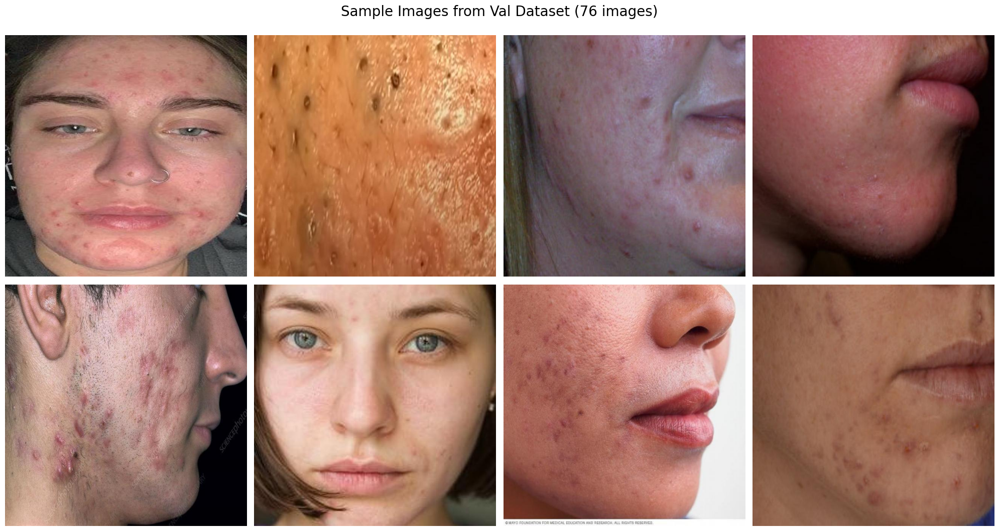

In [6]:
# Define the base paths for each dataset type
dataset_paths = {
    'train': '/kaggle/working/Pimples-detection-4/train/images',
    'test': '/kaggle/working/Pimples-detection-4/test/images',
    'val' : '/kaggle/working/Pimples-detection-4/valid/images'
}
num_samples = 30
for dataset_name, image_folder in dataset_paths.items():
    if not os.path.isdir(image_folder):
        print(f"Directory {image_folder} does not exist.")
        continue
    image_files = [file for file in os.listdir(image_folder) if file.endswith('.jpg')]
    image_count = len(image_files)
    print(f"{dataset_name.capitalize()} dataset has {image_count} images.")
    if not image_files:
        print(f"No .jpg images found in the {image_folder} directory.")
        continue
    interval = max(1, image_count // num_samples)  
    selected_images = [image_files[i] for i in range(0, image_count, interval)][:num_samples] 

    # Create a 2x4 subplot for displaying 8 images
    fig, axes = plt.subplots(2, 4, figsize=(20, 11))

    # Display each of the selected images
    for ax, img_file in zip(axes.ravel(), selected_images):
        img_path = os.path.join(image_folder, img_file)
        image = Image.open(img_path)
        ax.imshow(image)
        ax.axis('off')  # Hide axis

    # Set the title for each dataset, including the count of images
    plt.suptitle(f'Sample Images from {dataset_name.capitalize()} Dataset ({image_count} images)', fontsize=20)
    plt.tight_layout()
    plt.show()


In [7]:
# Dataset and model paths
data_path = '/kaggle/working/Pimples-detection-4/data.yaml'  # Path to your data.yaml
model_path = '/kaggle/working/yolov9s.pt'  # Path to your pre-trained YOLOv9 model

# Training parameters
epochs = 200
imgsz = 500
batch_size = 30


In [8]:
# Load the model (adjust this according to your YOLOv9 implementation)
model = YOLO(model_path)

# Start training the model
model.train(data=data_path, epochs=epochs, imgsz=imgsz, batch=batch_size)


Ultralytics 8.3.206 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=30, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/Pimples-detection-4/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=500, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/kaggle/working/yolov9s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pat

invalid value encountered in less
invalid value encountered in less


                   all         76        663      0.824      0.795      0.819      0.579
                  Acne         18        112       0.65      0.205        0.3      0.076
               Pimples         26        307      0.497      0.257       0.26     0.0603
            acne_scars         16         42      0.898      0.952      0.948      0.756
             blackhead         20        107      0.767       0.57       0.67      0.256
                cystic          4          8      0.937          1      0.995      0.641
          folliculitis          1          2      0.821          1      0.995      0.812
                milium          1          1       0.75          1      0.995      0.895
               papular          9         20      0.831          1      0.943      0.712
              purulent          9         18          1      0.892      0.995      0.716
   sebo-crystan-conglo          6         24          1          1      0.995      0.817
             whitehea

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  6,  8,  9, 10, 11, 12])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f32c6377590>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.


image 1/1 /kaggle/working/runs/detect/train/train_batch3042.jpg: 512x512 1 Acne, 19.3ms
Speed: 2.4ms preprocess, 19.3ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


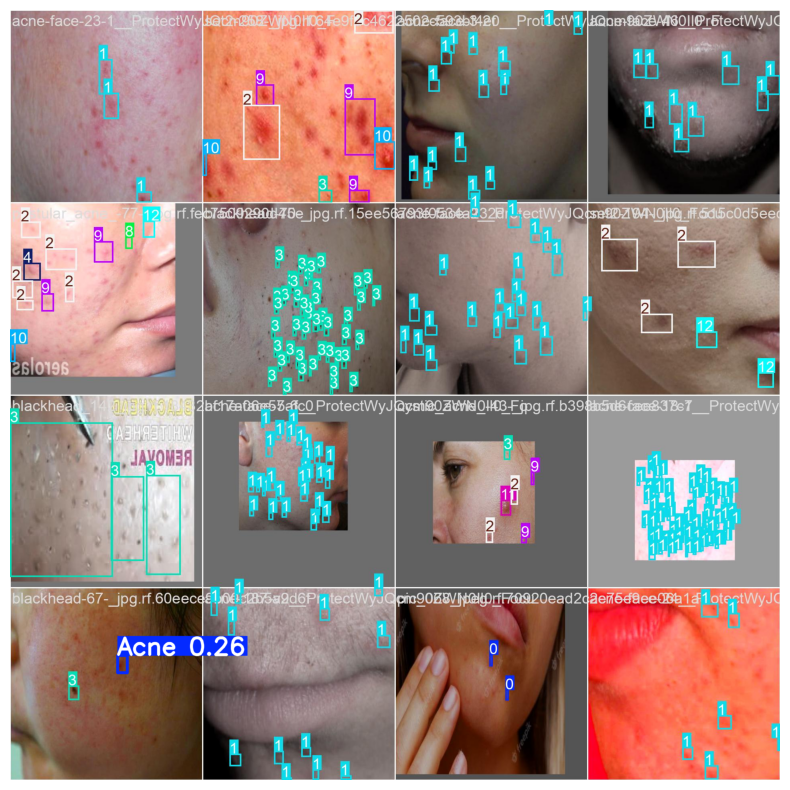

In [9]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load the trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')  
image_path = '/kaggle/working/runs/detect/train/train_batch3042.jpg'  # Replace with your image file path

# Make predictions on the image without saving the output
results = model.predict(image_path, 
                        conf=0.25,        # Confidence threshold (default: 0.25)
                        iou=0.45,         # Intersection over Union threshold (default: 0.45)
                        save=False,       # Do not save the predicted image to disk
                        show=False)       # Don't show via YOLO directly

# Access the image with predictions directly from the results
img_with_predictions = results[0].plot()

# Display the image using matplotlib in the notebook
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_with_predictions, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
plt.axis('off')  # Turn off axis labels
plt.show()



image 1/1 /kaggle/working/runs/detect/val/val_batch1_labels.jpg: 512x512 (no detections), 18.0ms
Speed: 2.7ms preprocess, 18.0ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


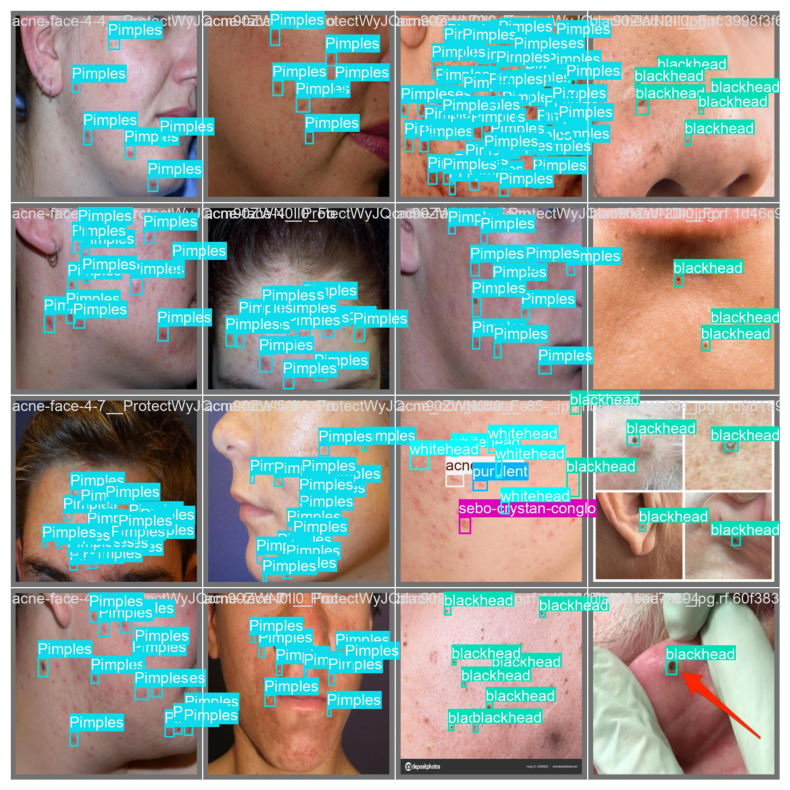

In [24]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load the trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')  
image_path = '/kaggle/working/runs/detect/val/val_batch1_labels.jpg'  # Replace with your image file path

# Make predictions on the image without saving the output
results = model.predict(image_path, 
                        conf=0.25,        # Confidence threshold (default: 0.25)
                        iou=0.45,         # Intersection over Union threshold (default: 0.45)
                        save=False,       # Do not save the predicted image to disk
                        show=False)       # Don't show via YOLO directly

# Access the image with predictions directly from the results
img_with_predictions = results[0].plot()

# Display the image using matplotlib in the notebook
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_with_predictions, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
plt.axis('off')  # Turn off axis labels
plt.show()



image 1/1 /kaggle/working/runs/detect/val/val_batch2_pred.jpg: 512x512 (no detections), 16.9ms
Speed: 2.4ms preprocess, 16.9ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


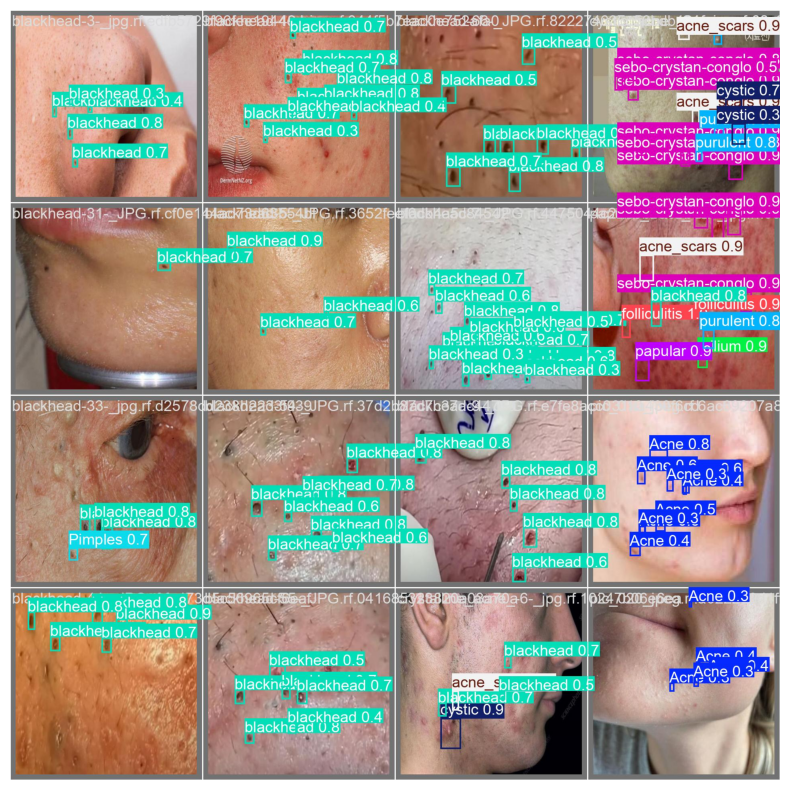

In [25]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load the trained model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')  
image_path = '/kaggle/working/runs/detect/val/val_batch2_pred.jpg'  # Replace with your image file path

# Make predictions on the image without saving the output
results = model.predict(image_path, 
                        conf=0.25,        # Confidence threshold (default: 0.25)
                        iou=0.45,         # Intersection over Union threshold (default: 0.45)
                        save=False,       # Do not save the predicted image to disk
                        show=False)       # Don't show via YOLO directly

# Access the image with predictions directly from the results
img_with_predictions = results[0].plot()

# Display the image using matplotlib in the notebook
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_with_predictions, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
plt.axis('off')  # Turn off axis labels
plt.show()


In [10]:
import os
# Define the path to the directory
post_training_files_path = '/kaggle/working/runs/detect/train'
#E:/yolo/runs/detect/train
files =os.listdir(post_training_files_path)
for file in files:
    print(file)

BoxF1_curve.png
BoxPR_curve.png
confusion_matrix.png
val_batch1_labels.jpg
results.png
confusion_matrix_normalized.png
val_batch0_labels.jpg
train_batch1.jpg
BoxR_curve.png
val_batch1_pred.jpg
BoxP_curve.png
train_batch3040.jpg
args.yaml
labels.jpg
train_batch0.jpg
results.csv
weights
train_batch3042.jpg
train_batch2.jpg
train_batch3041.jpg
val_batch0_pred.jpg


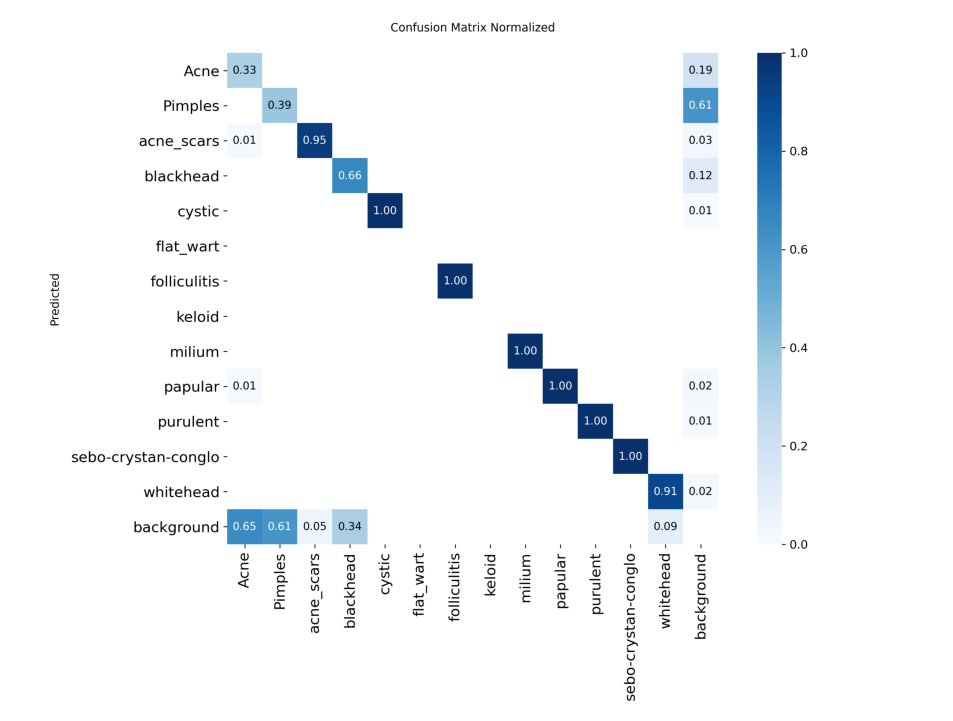

In [27]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, '/kaggle/working/runs/detect/val/confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

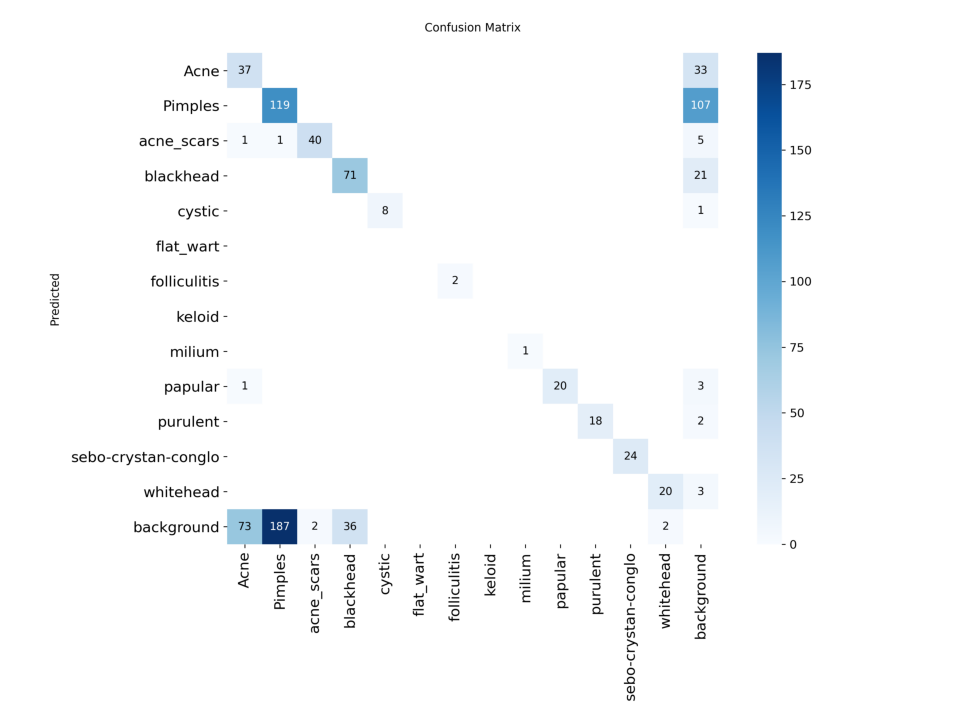

In [26]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, '/kaggle/working/runs/detect/val/confusion_matrix.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

In [15]:
# Ensure the correct path to data.yaml is passed if it's different from the default location
metrics1 = model.val(data="/kaggle/working/Pimples-detection-4/data.yaml", split="val")

Ultralytics 8.3.206 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 896.1±286.8 MB/s, size: 41.7 KB)
val: Scanning /kaggle/working/Pimples-detection-4/valid/labels.cache... 76 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 76/76 135.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 5/5 1.6it/s 3.1s0.9ss


invalid value encountered in less
invalid value encountered in less


                   all         76        663      0.823      0.795      0.819      0.576
                  Acne         18        112      0.649      0.205      0.295     0.0776
               Pimples         26        307      0.491      0.257      0.258     0.0605
            acne_scars         16         42      0.898      0.952      0.948      0.759
             blackhead         20        107      0.765       0.57      0.666      0.258
                cystic          4          8      0.939          1      0.995      0.631
          folliculitis          1          2      0.807          1      0.995      0.763
                milium          1          1      0.751          1      0.995      0.895
               papular          9         20      0.831          1      0.943      0.715
              purulent          9         18          1      0.897      0.995      0.716
   sebo-crystan-conglo          6         24          1      0.999      0.995      0.831
             whitehea

In [16]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics1.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.823
metrics/recall(B),0.795
metrics/mAP50(B),0.819
metrics/mAP50-95(B),0.576
fitness,0.576


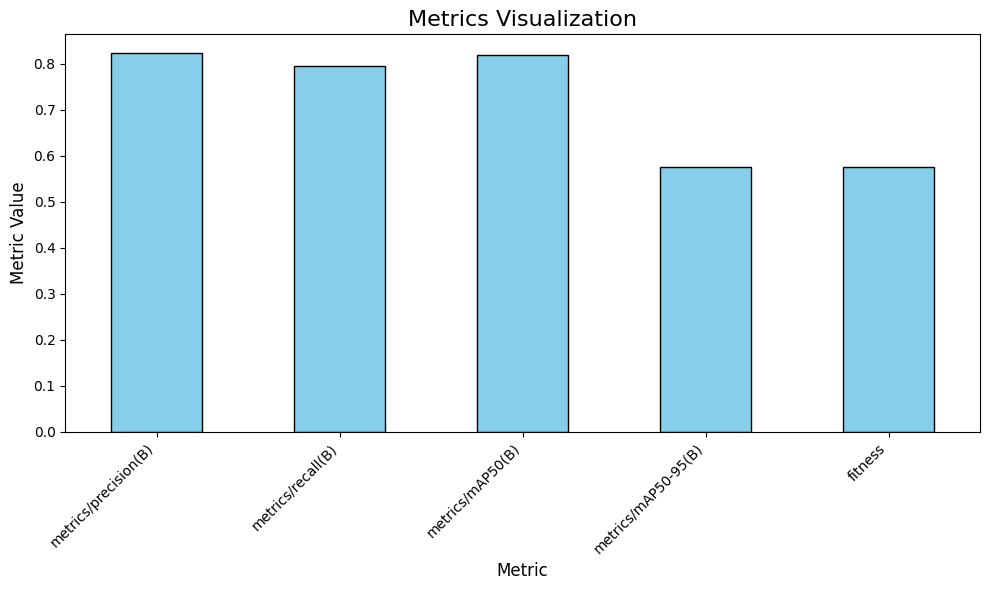

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'metrics.results_dict' is already available, convert it to DataFrame
metrics_df = pd.DataFrame.from_dict(metrics1.results_dict, orient='index', columns=['Metric Value'])

# Round the values to 3 decimal places
metrics_df = metrics_df.round(3)

# Plot the data
plt.figure(figsize=(10, 6))
metrics_df['Metric Value'].plot(kind='bar', color='skyblue', edgecolor='black')

# Customize the plot
plt.title('Metrics Visualization', fontsize=16)
plt.xlabel('Metric', fontsize=12)
plt.ylabel('Metric Value', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show plot
plt.show()


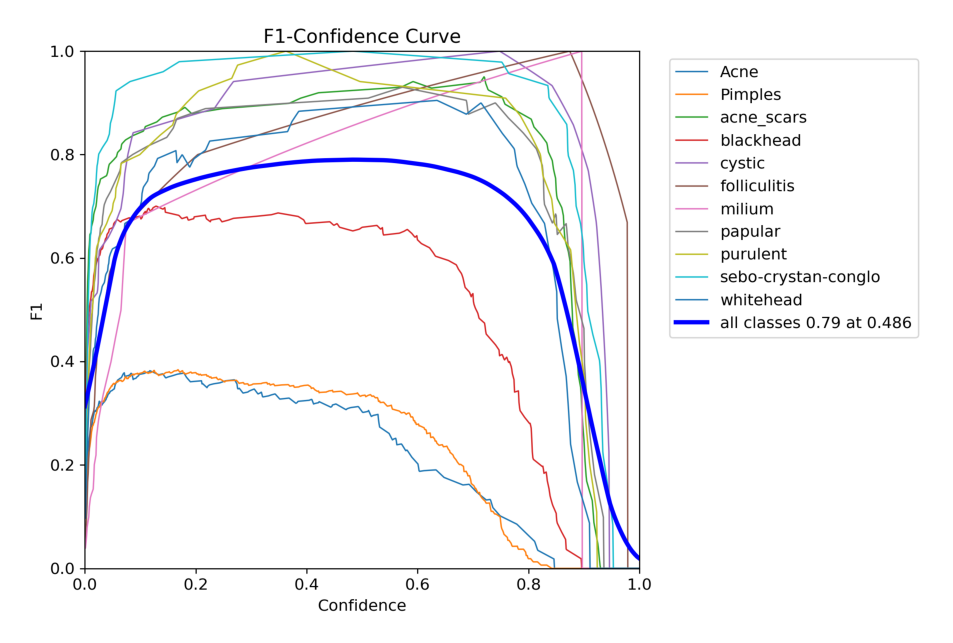

In [28]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, '/kaggle/working/runs/detect/val/BoxF1_curve.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

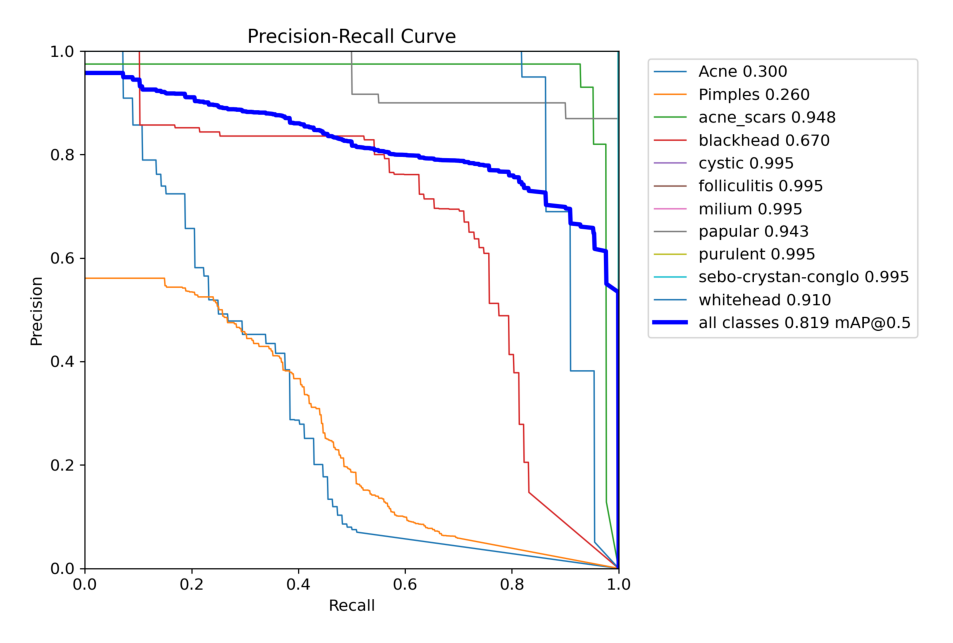

In [21]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, '/kaggle/working/runs/detect/train/BoxPR_curve.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

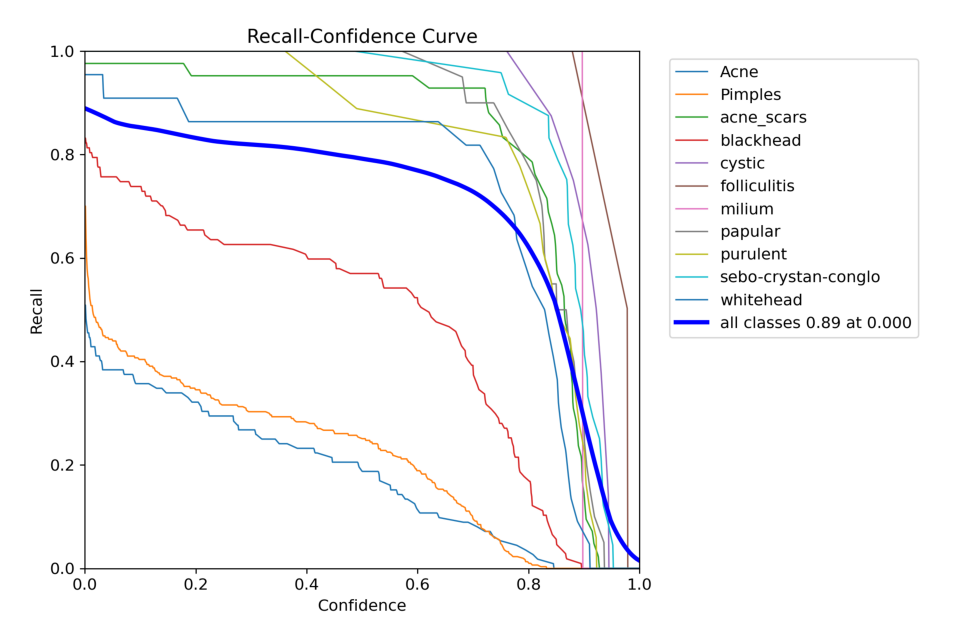

In [22]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, '/kaggle/working/runs/detect/train/BoxR_curve.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

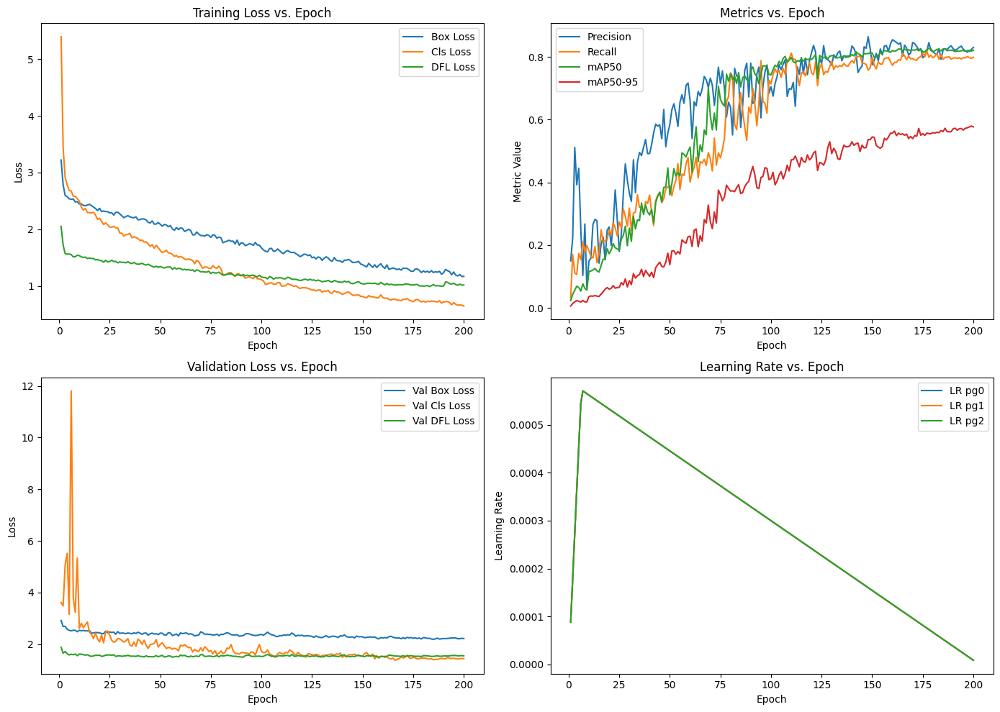

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your data from the Excel sheet
df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')

# Create the subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot train losses vs. epoch
axes[0, 0].plot(df['epoch'], df['train/box_loss'], label='Box Loss')
axes[0, 0].plot(df['epoch'], df['train/cls_loss'], label='Cls Loss')
axes[0, 0].plot(df['epoch'], df['train/dfl_loss'], label='DFL Loss')
axes[0, 0].set_title('Training Loss vs. Epoch')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()

# Plot metrics vs. epoch
axes[0, 1].plot(df['epoch'], df['metrics/precision(B)'], label='Precision')
axes[0, 1].plot(df['epoch'], df['metrics/recall(B)'], label='Recall')
axes[0, 1].plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP50')
axes[0, 1].plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP50-95')
axes[0, 1].set_title('Metrics vs. Epoch')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Metric Value')
axes[0, 1].legend()

# Plot validation losses vs. epoch
axes[1, 0].plot(df['epoch'], df['val/box_loss'], label='Val Box Loss')
axes[1, 0].plot(df['epoch'], df['val/cls_loss'], label='Val Cls Loss')
axes[1, 0].plot(df['epoch'], df['val/dfl_loss'], label='Val DFL Loss')
axes[1, 0].set_title('Validation Loss vs. Epoch')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].legend()

# Plot learning rate vs. epoch
axes[1, 1].plot(df['epoch'], df['lr/pg0'], label='LR pg0')
axes[1, 1].plot(df['epoch'], df['lr/pg1'], label='LR pg1')
axes[1, 1].plot(df['epoch'], df['lr/pg2'], label='LR pg2')
axes[1, 1].set_title('Learning Rate vs. Epoch')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Learning Rate')
axes[1, 1].legend()

# Adjust layout
plt.tight_layout()
plt.show()



image 1/1 /kaggle/working/Pimples-detection-4/test/images/blackhead-61-_JPG.rf.d747a91be9c5fcade7dcc60a352299b0.jpg: 640x640 9 blackheads, 61.0ms
Speed: 2.4ms preprocess, 61.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/Pimples-detection-4/test/images/acne-face-1-11__ProtectWyJQcm90ZWN0Il0_FocusFillWzI5NCwyMjIsIngiLDE4XQ_jpg.rf.1f1530b9d3ca6eb47435daf9d5b65065.jpg: 640x640 5 Pimpless, 16.9ms
Speed: 2.0ms preprocess, 16.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/Pimples-detection-4/test/images/acne-face-2-27__ProtectWyJQcm90ZWN0Il0_FocusFillWzI5NCwyMjIsIngiLDFd_jpg.rf.4d4d45e70430b623f044df1f2b91de28.jpg: 640x640 2 Pimpless, 17.0ms
Speed: 1.5ms preprocess, 17.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/Pimples-detection-4/test/images/pic_017_jpeg.rf.1e184fa041f926971dc26d015bb48a6f.jpg: 640x640 4 Acnes, 16.0ms
Speed: 1.5ms preprocess

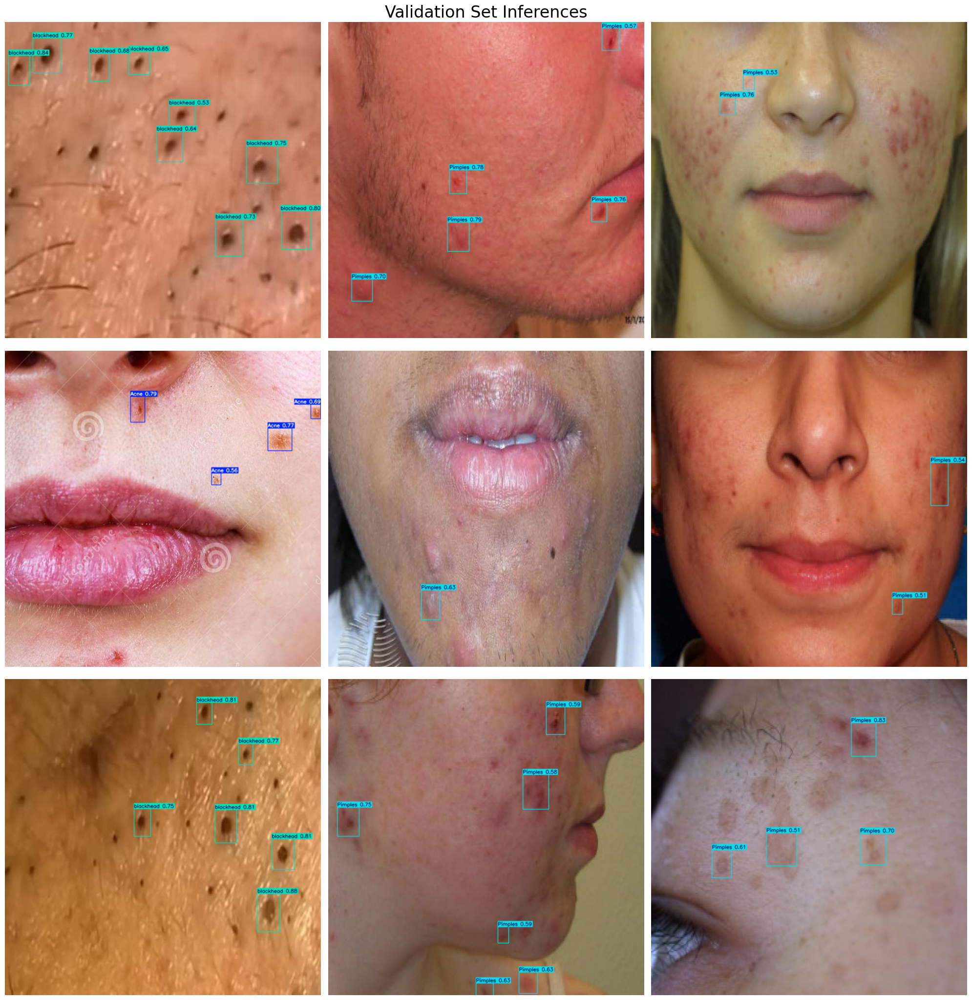

In [19]:
import os
import cv2
import matplotlib.pyplot as plt

# Define the path to the validation images
valid_images_path = '/kaggle/working/Pimples-detection-4/test/images'  # Update this path to the 'val/images' directory

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [23]:
import shutil

# Define the directory you want to zip
folder_path = '/kaggle/working/runs'  # Replace with your folder name
zip_path = '/kaggle/working/working_data.zip'

# Zip the folder
shutil.make_archive(zip_path.replace('.zip', ''), 'zip', folder_path)

'/kaggle/working/working_data.zip'